# Familiar with Diffusion models - Played with Dreambooth, etc as written in the form.

In [1]:
!pip install gradio spaces diffusers accelerate

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 81.0 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.2/318.2 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 69.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 93.6 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.2/47.2 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.4/121.4 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 9.2 MB/s eta 0:00:00
  Created wheel for ffmpy: filename=ffmpy-0.3.2-py3-none-any.whl size=5584 sha256=0bf5d2e5c74bf5be8677aeaaa3d93be384504fd2ea64ce68853a332740a8945f
  Stored in directory: /root/.cache/pip/wheels/bd/65/9a/671fc6dcde07d4418df0c592f8df512b26d7a0029c2a23dd81
Successfully built ffmpy
  Attempting uninstall: websockets
    Found existing installation: websockets 12.0
    Uninstalling webso

In [2]:
!git clone https://github.com/xinntao/Real-ESRGAN.git
%cd Real-ESRGAN
# Set up the environment
!pip install basicsr
!pip install facexlib
!pip install gfpgan
!pip install -r requirements.txt
!python setup.py develop

fatal: destination path 'Real-ESRGAN' already exists and is not an empty directory.
/kaggle/working/Real-ESRGAN
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.5/172.5 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 91.6 MB/s eta 0:00:00:00:01
  Created wheel for basicsr: filename=basicsr-1.4.2-py3-none-any.whl size=214817 sha256=f7c278dae507a71c9ff8a4b667c2fe48f8dbe8dcf99b2e01b8b6ff62ecc8c012
  Stored in directory: /root/.cache/pip/wheels/38/83/99/2d8437cc652a01af27df5ff037a4075e95b52d67705c5f30ca
Successfully built basicsr
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 3.6 MB/s eta 0:00:00
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110458 sha256=ce6fb41bb073fca1da8b8dc34

In [3]:
!pip install git+https://github.com/sberbank-ai/Real-ESRGAN.git

  Cloning https://github.com/sberbank-ai/Real-ESRGAN.git to /tmp/pip-req-build-_vrshm4f
  Running command git clone --filter=blob:none --quiet https://github.com/sberbank-ai/Real-ESRGAN.git /tmp/pip-req-build-_vrshm4f
  Resolved https://github.com/sberbank-ai/Real-ESRGAN.git to commit 362a0316878f41dbdfbb23657b450c3353de5acf
  Preparing metadata (setup.py) ... done
  Created wheel for RealESRGAN: filename=RealESRGAN-1.0-py3-none-any.whl size=9106 sha256=97ee93c7ef1c9e8fd9684a8c05ad39a24171c3e5c9b598a1ac0a561a7944e9b8
  Stored in directory: /tmp/pip-ephem-wheel-cache-pt7carej/wheels/dd/a3/7d/774508ed192455403be294c8a6c4ad1c83dde8fcdd8903e64a
Successfully built RealESRGAN
  Attempting uninstall: RealESRGAN
    Found existing installation: realesrgan 0.3.0
    Uninstalling realesrgan-0.3.0:
      Successfully uninstalled realesrgan-0.3.0


In [ ]:
from diffusers import StableDiffusionPipeline
import torch
from RealESRGAN import RealESRGAN
import matplotlib.pyplot as plt
from time import time 

model_id = "emilianJR/epiCRealism"

pipeline = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipeline = pipeline.to("cuda")

scheduler = DDIMScheduler.from_pretrained(
    model_id,
    subfolder="scheduler",
    clip_sample=False,
    timestep_spacing="linspace",
    beta_schedule="linear",
    steps_offset=1,
)
pipeline.scheduler = scheduler
pipeline.enable_vae_slicing()

pipeline.load_ip_adapter("h94/IP-Adapter", subfolder="models", weight_name="ip-adapter_sd15.bin")
pipeline.enable_model_cpu_offload()
pipeline.unet.encoder_hid_proj = None
model = RealESRGAN(device, scale=4)
model.load_weights('weights/RealESRGAN_x4.pth', download=True)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

2024-07-11 16:41:55.647484: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-11 16:41:55.647592: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-11 16:41:55.786857: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


model_index.json:   0%|          | 0.00/579 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.58k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/528 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/577 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.58k [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [173]:
prompts = ["A full body Close-up portrait of Jennifer Larence an actor in a wedding gown, face with intricate details, photorealistic, 8k ultra HD",
    "Close-up shot of Jennifer Larence face with expressive eyes with colorful background, highly detailed skin texture, studio lighting, professional photography",
    "A full body close-up portrait of Jennifer Larence in a wedding suit, standing in front of softly lit garden background, intricate facial features, photorealistic, 8k ultra HD, detailed skin texture, professional photography"]
negative_prompt = "Bad anatomy, Bad proportions, Deformed, Disconnected limbs, Disfigured, Extra arms, Extra limbs, Extra hands, Fused fingers, Gross proportions, Long neck, Malformed limbs, Mutated, Mutated hands, Mutated limbs, Missing arms, Missing fingers, Poorly drawn hands, Poorly drawn face."
start_time = time()

image = pipe(prompt=prompts[0],steps = 60, 
             negative_prompt = negative_prompt,  guidance_scale=8.5).images[0]
end_time = time()

time_taken = end_time - start_time 

print(f"Time taken- {time_taken}")
print(f"Image: {image.size}")
    
image.save("image.png")

scaled_image = model.predict(image)

scaled_image.save('scaled_image.png')

  0%|          | 0/50 [00:00<?, ?it/s]

Time taken- 8.017184972763062
Image: (512, 512)


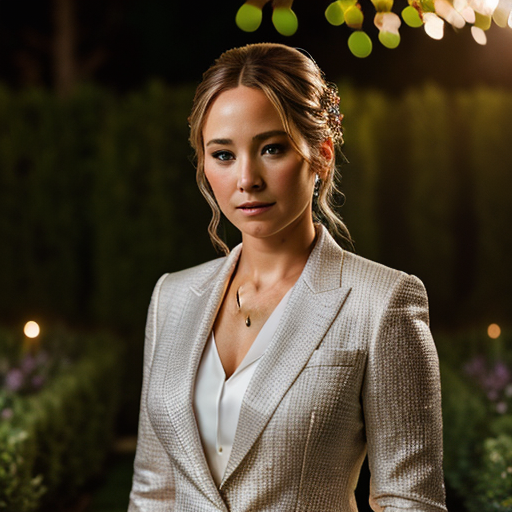

In [174]:
img = Image.open(r'/kaggle/working/Real-ESRGAN/image2.png')
display(img)

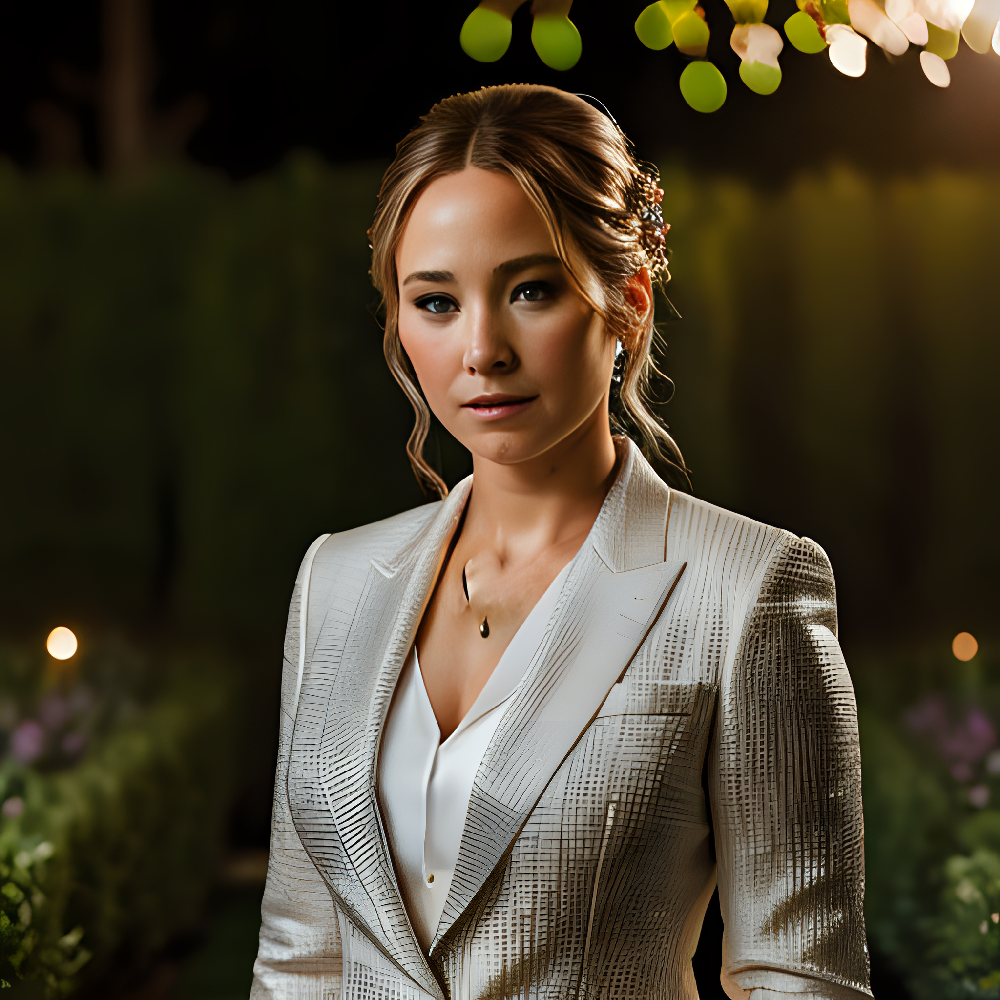

In [168]:
img = Image.open(r'/kaggle/working/Real-ESRGAN/scaled_image2.png')
display(img)

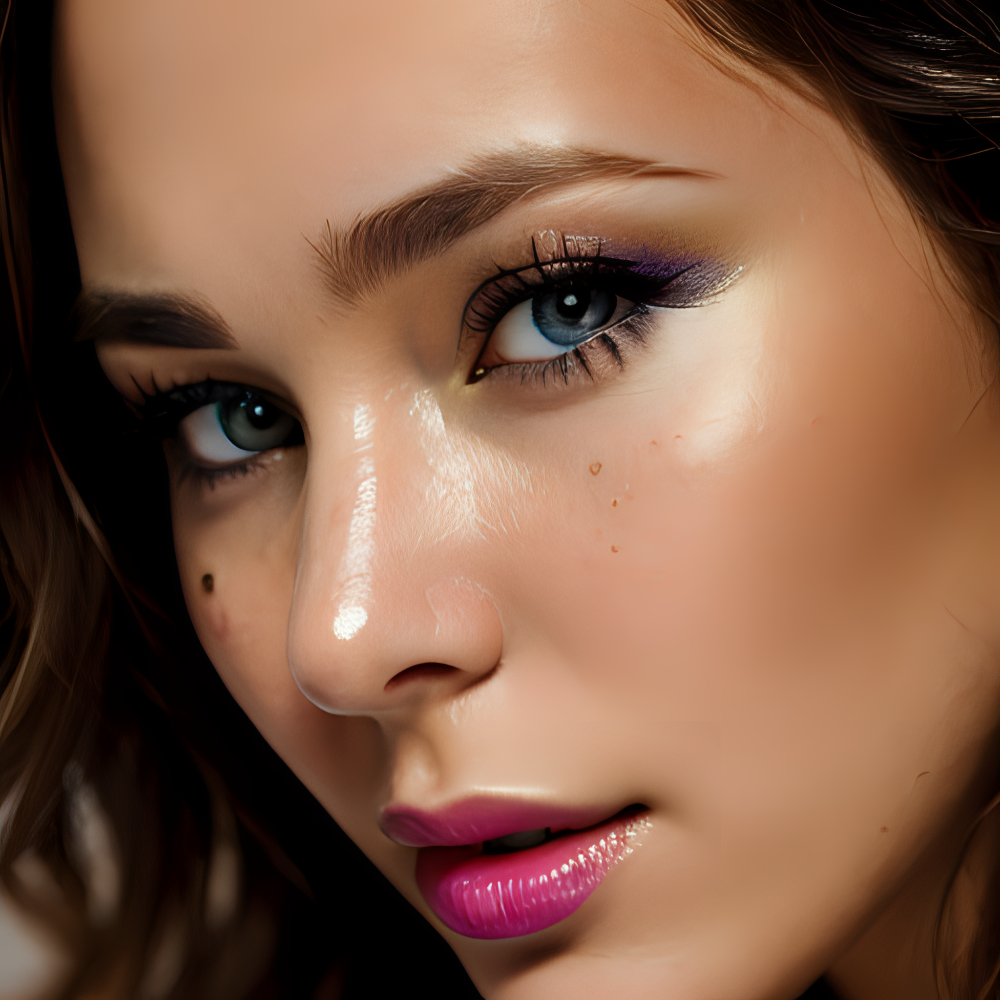

In [170]:
img = Image.open(r'/kaggle/working/Real-ESRGAN/scaled_image1.png')
display(img)

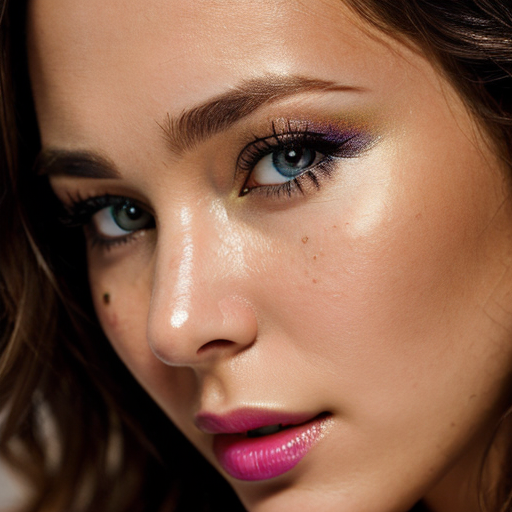

In [172]:
img = Image.open(r'/kaggle/working/Real-ESRGAN/image1.png')
display(img)

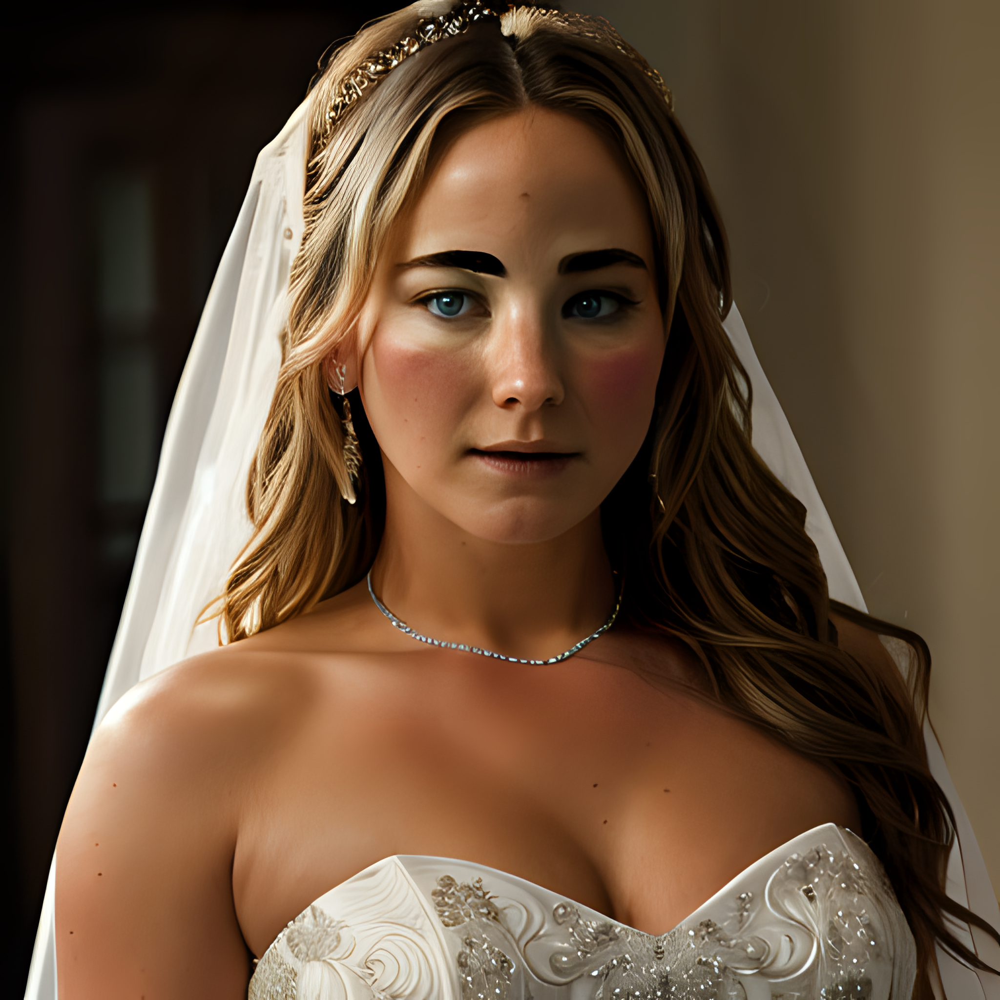

In [175]:
img = Image.open(r'/kaggle/working/Real-ESRGAN/scaled_image.png')
display(img)

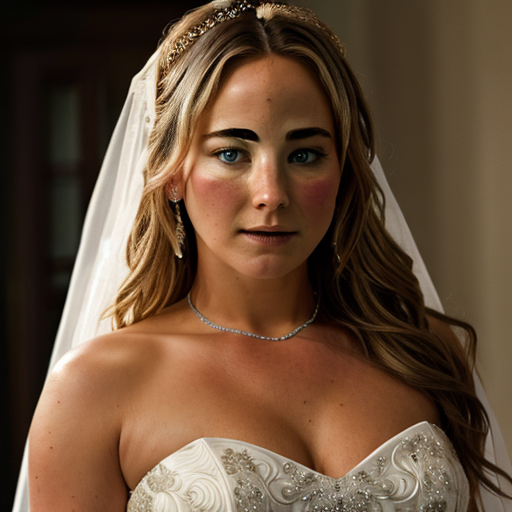

In [176]:
img = Image.open(r'/kaggle/working/Real-ESRGAN/image.png')
display(img)